In [1]:
# Importing the libraries 

import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt

# Ignore harmless warnings 

import warnings 
warnings.filterwarnings("ignore")

# Set to display all the columns in dataset

pd.set_option("display.max_columns", None)

# Import psql to run queries 

import pandasql as psql

In [2]:
# Load the 'Universal Bank' data

CustChurn = pd.read_csv(r"C:\Users\Admin\Downloads\Raju Sir DLS\Universalbank.csv", header=0)
CustChurn.head()

,ID,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
0,1,25,1,49,91107,4,1.6,1,0,0,1,0,0,0
1,2,45,19,34,90089,3,1.5,1,0,0,1,0,0,0
2,3,39,15,11,94720,1,1.0,1,0,0,0,0,0,0
3,4,35,9,100,94112,1,2.7,2,0,0,0,0,0,0
4,5,35,8,45,91330,4,1.0,2,0,0,0,0,0,1


In [3]:
# Check if there are duplicate rows in the dataset

CustChurn.duplicated().any()

False

In [4]:
# Load the 'Universal Bank' data

Bankdata = pd.read_csv(r"C:\Users\Admin\Downloads\Raju Sir DLS\Universalbank.csv", header=0)
Bankdata.head()

,ID,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
0,1,25,1,49,91107,4,1.6,1,0,0,1,0,0,0
1,2,45,19,34,90089,3,1.5,1,0,0,1,0,0,0
2,3,39,15,11,94720,1,1.0,1,0,0,0,0,0,0
3,4,35,9,100,94112,1,2.7,2,0,0,0,0,0,0
4,5,35,8,45,91330,4,1.0,2,0,0,0,0,0,1


In [5]:
#display the shape of the dataset(no of records, variables)
Bankdata.shape

(5000, 14)

In [6]:
Bankdata_bk = Bankdata.copy()

In [7]:
#deleteing unncessary columns
del Bankdata['ID']
del Bankdata['ZIP Code']

In [8]:
#identifying independent and target variables
IndepVar = []
for col in Bankdata.columns:
    if col != 'CreditCard':
        IndepVar.append(col)

TargetVar = 'CreditCard'

x = Bankdata[IndepVar]
y = Bankdata[TargetVar]

In [11]:
#Splitting the dataset into train and test
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.30, random_state = 42) 

In [12]:
# Feature Scaling - Each independent variable is in different range. The process of transforming all the 
# features in the given data set to a fixed range is known as ‘Scaling’

from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
x_train = sc.fit_transform(x_train)
x_test = sc.fit_transform(x_test)

Confusion matrix : 
 [[105 322]
 [108 965]]
Outcome values : 
 105 322 108 965
Classification report : 
               precision    recall  f1-score   support

           1       0.49      0.25      0.33       427
           0       0.75      0.90      0.82      1073

    accuracy                           0.71      1500
   macro avg       0.62      0.57      0.57      1500
weighted avg       0.68      0.71      0.68      1500

Accuracy : 71.3 %
Precision : 49.3 %
Recall : 24.6 %
F1 Score : 0.328
Specificity or True Negative Rate : 89.9 %
Balanced Accuracy : 57.2 %
MCC : 0.188
roc_auc_score: 0.573


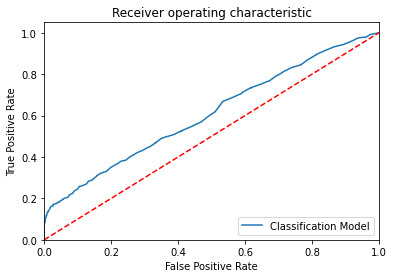

-----------------------------------------------------------------------------------------------------


In [13]:
# To build the 'Multinominal Decision Tree' model with random sampling

from sklearn.ensemble import RandomForestClassifier

BankdataRF = RandomForestClassifier(n_estimators=100, criterion='gini', max_depth=None, min_samples_split=2,
                                    min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_features='sqrt', 
                                    max_leaf_nodes=None, min_impurity_decrease=0.0, bootstrap=True, oob_score=False, 
                                    n_jobs=None, random_state=None, verbose=0, warm_start=False, class_weight=None, 
                                    ccp_alpha=0.0, max_samples=None)

# Train the model with train data 

BankdataRF.fit(x_train,y_train)

# Predict the model with test data set

y_pred = BankdataRF.predict(x_test)
y_pred_prob = BankdataRF.predict_proba(x_test)

# Confusion matrix in sklearn

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# actual values

actual = y_test

# predicted values

predicted = y_pred

# confusion matrix

matrix = confusion_matrix(actual,predicted, labels=[1,0],sample_weight=None, normalize=None)
print('Confusion matrix : \n', matrix)

# outcome values order in sklearn

tp, fn, fp, tn = confusion_matrix(actual,predicted,labels=[1,0]).reshape(-1)
print('Outcome values : \n', tp, fn, fp, tn)

# classification report for precision, recall f1-score and accuracy

C_Report = classification_report(actual,predicted,labels=[1,0])

print('Classification report : \n', C_Report)

# calculating the metrics

sensitivity = round(tp/(tp+fn), 3);
specificity = round(tn/(tn+fp), 3);
accuracy = round((tp+tn)/(tp+fp+tn+fn), 3);
balanced_accuracy = round((sensitivity+specificity)/2, 3);
precision = round(tp/(tp+fp), 3);
f1Score = round((2*tp/(2*tp + fp + fn)), 3);

# Matthews Correlation Coefficient (MCC). Range of values of MCC lie between -1 to +1. 
# A model with a score of +1 is a perfect model and -1 is a poor model

from math import sqrt

mx = (tp+fp) * (tp+fn) * (tn+fp) * (tn+fn)
MCC = round(((tp * tn) - (fp * fn)) / sqrt(mx), 3)

print('Accuracy :', round(accuracy*100, 2),'%')
print('Precision :', round(precision*100, 2),'%')
print('Recall :', round(sensitivity*100,2), '%')
print('F1 Score :', f1Score)
print('Specificity or True Negative Rate :', round(specificity*100,2), '%'  )
print('Balanced Accuracy :', round(balanced_accuracy*100, 2),'%')
print('MCC :', MCC)

# Area under ROC curve 

from sklearn.metrics import roc_curve, roc_auc_score

print('roc_auc_score:', round(roc_auc_score(y_test, y_pred), 3))

# ROC Curve

from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
logit_roc_auc = roc_auc_score(y_test, y_pred)
fpr, tpr, thresholds = roc_curve(y_test,BankdataRF.predict_proba(x_test)[:,1])
plt.figure()
# plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
plt.plot(fpr, tpr, label= 'Classification Model' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show() 
print('-----------------------------------------------------------------------------------------------------')

Feature: 0, Score: 0.15212
Feature: 1, Score: 0.15143
Feature: 2, Score: 0.23153
Feature: 3, Score: 0.05483
Feature: 4, Score: 0.14402
Feature: 5, Score: 0.04069
Feature: 6, Score: 0.08762
Feature: 7, Score: 0.00942
Feature: 8, Score: 0.01614
Feature: 9, Score: 0.07717
Feature: 10, Score: 0.03502


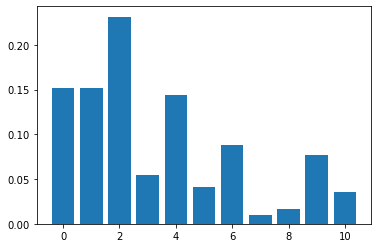

In [14]:
# To get feature importance

from matplotlib import pyplot

importance =BankdataRF.feature_importances_

# Summarize feature importance

for i,v in enumerate(importance):
    print('Feature: %0d, Score: %.5f' % (i,v))
    
# Plot feature importance

pyplot.bar([x for x in range(len(importance))], importance)
pyplot.show()

In [15]:
Bankdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 12 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Age                 5000 non-null   int64  
 1   Experience          5000 non-null   int64  
 2   Income              5000 non-null   int64  
 3   Family              5000 non-null   int64  
 4   CCAvg               5000 non-null   float64
 5   Education           5000 non-null   int64  
 6   Mortgage            5000 non-null   int64  
 7   Personal Loan       5000 non-null   int64  
 8   Securities Account  5000 non-null   int64  
 9   CD Account          5000 non-null   int64  
 10  Online              5000 non-null   int64  
 11  CreditCard          5000 non-null   int64  
dtypes: float64(1), int64(11)
memory usage: 468.9 KB


In [16]:
# Results

PredResults = pd.DataFrame({'CreditCard_A':y_test, 'CreditCard_P':y_pred})

# Merge two Dataframes on index of both the dataframes

TestDataResults = Bankdata_bk.merge(PredResults, left_index=True, right_index=True)
TestDataResults.sample(10)

,ID,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard,CreditCard_A,CreditCard_P
4651,4652,48,24,58,94005,2,1.7,1,0,0,0,0,0,0,0,0
4461,4462,46,21,30,94301,4,1.9,3,0,0,0,0,1,0,0,0
1630,1631,41,17,99,92096,2,1.8,2,0,0,0,0,1,1,1,0
4504,4505,27,1,41,93023,4,1.8,3,147,0,0,0,0,0,0,0
2646,2647,45,20,191,92007,3,2.6,3,123,1,0,0,0,0,0,0
4221,4222,48,22,83,90028,2,0.4,3,248,0,0,0,1,0,0,0
756,757,56,31,82,95348,4,1.3,3,0,0,0,0,1,0,0,0
1593,1594,63,38,83,91320,3,1.8,2,0,0,0,0,1,0,0,0
4215,4216,64,40,21,94028,2,0.3,3,0,0,0,0,0,0,0,0
2937,2938,62,36,89,94022,2,2.0,1,0,0,0,0,1,1,1,0


In [18]:
Bankdata.columns

Index(['Age', 'Experience', 'Income', 'Family', 'CCAvg', 'Education',
       'Mortgage', 'Personal Loan', 'Securities Account', 'CD Account',
       'Online', 'CreditCard'],
      dtype='object')

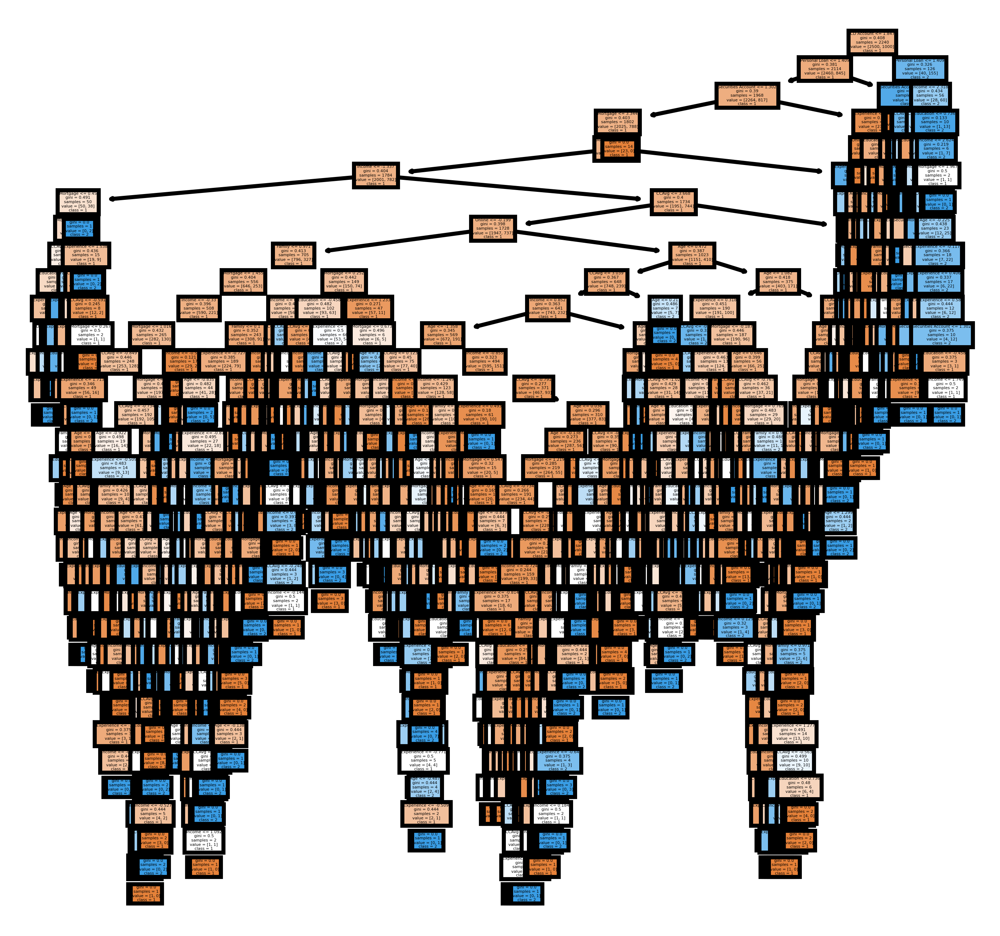

In [20]:
# Visualize individual trees and code below visualizes the first decision tree of Random Forest

from sklearn import tree

cols1 = ['Age', 'Experience', 'Income', 'Family', 'CCAvg', 'Education', 'Mortgage', 'Personal Loan', 'Securities Account',
         'CD Account','Online']

fn1=cols1
cn1=['1', '2']

fig, axes = plt.subplots(nrows = 1, ncols = 1, figsize = (4,4), dpi=800)
tree.plot_tree(BankdataRF.estimators_[0],
               feature_names = fn1, 
               class_names=cn1,
               filled = True);
#fig.savefig('CustChurnRF.png')

In [21]:
# Visualize individual trees and code below visualizes the first 5 decision trees of Random Forest

from sklearn import tree

cols2 = ['Age', 'Experience', 'Income', 'Family', 'CCAvg', 'Education', 'Mortgage', 'Personal Loan', 'Securities Account',
         'CD Account','Online']

fn2=cols2
cn2=['1', '2']

fig, axes = plt.subplots(nrows = 1, ncols = 5, figsize = (10,2), dpi=3000)
for index in range(0, 5):
    tree.plot_tree(BankdataRF.estimators_[index],
                   feature_names = fn2, 
                   class_names=cn2,
                   filled = True,
                   ax = axes[index]);
    
    axes[index].set_title('Estimator: ' + str(index), fontsize = 11)